In [1]:
# importing the module
import ast
import pandas as pd

# Opening JSON file
with open('corona_tweets_50_data.txt', encoding='utf-8') as json_file:
    tweets = []
    for line in json_file:
        tweets.append(ast.literal_eval(line))

In [4]:
import ast
with open('corona_geotweets_50_data.txt', encoding='utf-8') as json_file:
    geotweets = []
    for line in json_file:
        geotweets.append(ast.literal_eval(line))

In [19]:
import pandas as pd
#tweet_df = pd.DataFrame(tweets, columns = ['possibly_sensitive', 'entities', 'text', 'public_metrics', 'id', 'context_annotations', 'lang', 'in_reply_to_user_id', 'author_id', 'source', 'referenced_tweets', 'created_at', 'geo']) 
geotweet_df = pd.DataFrame(geotweets, columns = ['possibly_sensitive', 'entities', 'text', 'public_metrics', 'id', 'context_annotations', 'lang', 'in_reply_to_user_id', 'author_id', 'source', 'referenced_tweets', 'created_at', 'geo']) 
print(geotweet_df.head())
print(geotweet_df.dtypes)
print(geotweets[1])

   possibly_sensitive                                           entities  \
0               False  {'urls': [{'start': 12, 'end': 35, 'url': 'htt...   
1               False  {'annotations': [{'start': 25, 'end': 43, 'pro...   
2               False  {'annotations': [{'start': 207, 'end': 211, 'p...   
3               False  {'annotations': [{'start': 0, 'end': 4, 'proba...   
4               False  {'mentions': [{'start': 0, 'end': 16, 'usernam...   

                                                text  \
0                Me Neither! https://t.co/LWXJRb5lKt   
1  Can she donate plasma to Ruth Bader Ginsburg? ...   
2  I am 58 years old, have a wife and 4 children....   
3  Trump is scared of these facts and is totally ...   
4  @realDonaldTrump Time to Dump Fauci. Watch the...   

                                      public_metrics                   id  \
0  {'retweet_count': 0, 'reply_count': 0, 'like_c...  1258247691483713537   
1  {'retweet_count': 0, 'reply_count': 0, 'like_c...

In [20]:
# Task 1
import datetime
import plotly.express as px

def get_hour(d):
    new_date = datetime.datetime.strptime(d,"%Y-%m-%dT%H:%M:%S.%fZ")
    return new_date.hour

geotweet_df['hour_tweeted'] = geotweet_df['created_at'].apply(get_hour)

df = geotweet_df
fig = px.histogram(df, x="hour_tweeted", nbins=24, title = "Tweet Count by Hour on Thursday May 7, 2020")
fig.show()

In [22]:
# Open users_reduced
with open('users.txt', encoding='utf-8') as user_file:
    users = []
    for line in user_file:
        users.append(ast.literal_eval(line))
    for i in range(3):
        print(users[i])
        print('\n')

{'location': 'Fairport, NY', 'id': '485584481', 'username': 'ScottRulebook19', 'description': '24 years officiating', 'name': 'David Scott', 'protected': False, 'url': '', 'verified': False, 'public_metrics': {'followers_count': 424, 'following_count': 523, 'tweet_count': 63028, 'listed_count': 4}, 'profile_image_url': 'https://pbs.twimg.com/profile_images/1120426336525475843/tkXjzcM7_normal.png', 'created_at': '2012-02-07T10:57:07.000Z'}


{'entities': {'url': {'urls': [{'start': 0, 'end': 23, 'url': 'https://t.co/qBk5pEzo8y', 'expanded_url': 'https://www.suicidegirls.com/join/?aid=1032495', 'display_url': 'suicidegirls.com/join/?aid=1032…'}]}}, 'public_metrics': {'followers_count': 63, 'following_count': 466, 'tweet_count': 18672, 'listed_count': 0}, 'created_at': '2019-09-09T05:59:59.000Z', 'username': 'johnnybebad666_', 'protected': False, 'location': 'Queens, NY', 'id': '1170939664196354048', 'url': 'https://t.co/qBk5pEzo8y', 'profile_image_url': 'https://pbs.twimg.com/profile_ima

In [23]:
users_df = pd.DataFrame(users, columns = ['id', 'protected', 'url', 'public_metrics', 'name', 'created_at', 'username', 'location', 'description', 'profile_image_url', 'verified']) 
print(users_df.head())

                    id  protected                      url  \
0            485584481      False                            
1  1170939664196354048      False  https://t.co/qBk5pEzo8y   
2            115105973      False  https://t.co/t74yvZEPTN   
3             72783659      False  https://t.co/VBEavkDtgb   
4            291865661      False                            

                                      public_metrics  \
0  {'followers_count': 424, 'following_count': 52...   
1  {'followers_count': 63, 'following_count': 466...   
2  {'followers_count': 153881, 'following_count':...   
3  {'followers_count': 130925, 'following_count':...   
4  {'followers_count': 6072, 'following_count': 3...   

                            name                created_at         username  \
0                    David Scott  2012-02-07T10:57:07.000Z  ScottRulebook19   
1  John Fitzgerald Kennedy Page®  2019-09-09T05:59:59.000Z  johnnybebad666_   
2               Sylvester Turner  2010-02-17T16:39:53

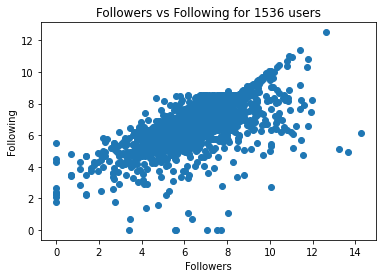

In [24]:
# Followers vs Following
import numpy as np
import matplotlib.pyplot as plt
num_users = len(users_df.index)
followers = np.zeros(shape=(num_users,1))
following = np.zeros(shape=(num_users,1))
for row in range(num_users):
    num1 = users_df.public_metrics[row]['followers_count']
    num2 = users_df.public_metrics[row]['following_count']
    followers[row] = num1 if num1 > 0 else 1
    following[row] = num2 if num2 > 0 else 1
plt.scatter(np.log(followers), np.log(following))
plt.title("Followers vs Following for " + str(num_users) + " users")
plt.xlabel("Followers")
plt.ylabel("Following")
plt.show()

In [25]:
def get_retweet_count(public_metrics):
    if public_metrics:
        return public_metrics['retweet_count']
    else:
        return "NaN"
def get_mention_count(entity):
    if type(entity) == type({}) and 'mentions' in entity:
        return len(entity['mentions'])
    else:
        return "NaN"
    
data = [geotweet_df['public_metrics'], geotweet_df['entities']]
headers = ["public_metrics", "entities"]
plot_df = pd.concat(data, axis=1, keys=headers)
plot_df["retweet_count"] = plot_df["public_metrics"].apply(get_retweet_count)
plot_df["mention_count"] = plot_df["entities"].apply(get_mention_count)
plot_df = plot_df.drop(["public_metrics", "entities"], axis=1)
plot_df = plot_df.dropna()

fig = px.scatter(x=plot_df["mention_count"], y=plot_df["retweet_count"], labels=dict(x="Number of Mentions", y="Number of Retweets"), title="Number of Retweets vs Number of Mentions for Covid19 Tweets on May 7, 2020")
fig.show()

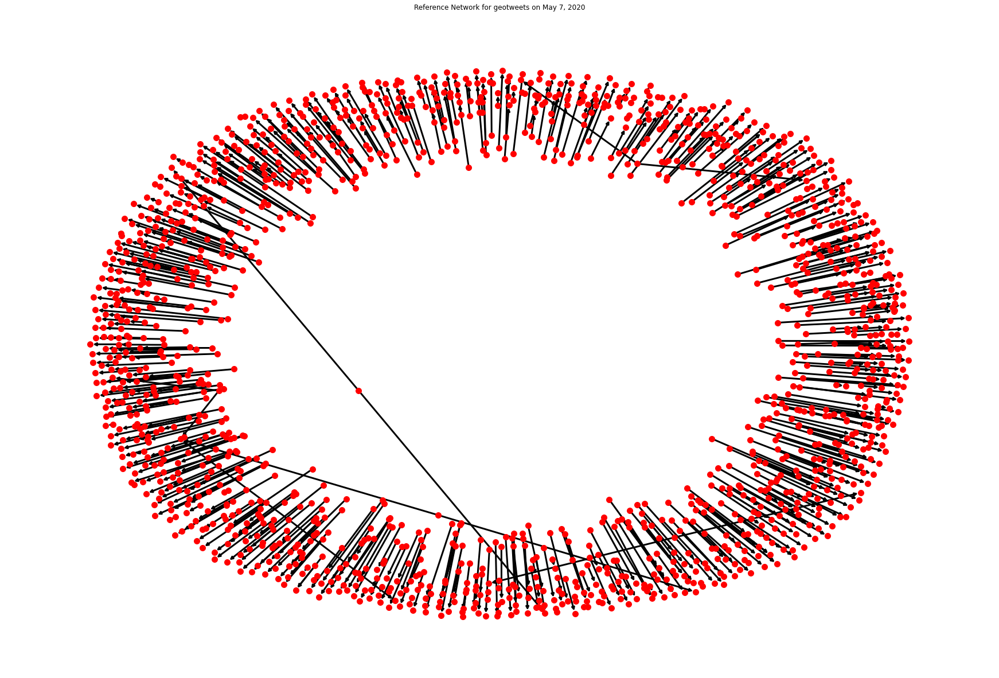

In [15]:
import networkx as nx

# Each node is tweet, connection A->B means A references B
edges = []
def get_referenced_ids(referenced_tweets):
    refer_tweets = []
    if type(referenced_tweets) == type([]) and referenced_tweets:
        for reference in referenced_tweets:
            refer_tweets.append(reference['id'])
    return refer_tweets
geotweet_df["referenced_tweet_ids"] = geotweet_df["referenced_tweets"].apply(get_referenced_ids)
geotweetmini_df = geotweet_df[geotweet_df.index % 10 == 0] # So it can run faster...
for index, row in geotweetmini_df.iterrows():
    tweet_id = row["id"]
    for reference_id in row["referenced_tweet_ids"]:
        edges.append((tweet_id, reference_id))
#edges[:5] sanity check
#test = geotweet_df[geotweet_df.referenced_tweet_ids.map(len)>1] This line was just to show you caa have more than one referenced tweets for one tweet
#G = nx.from_pandas_edgelist(geotweet_df, 'author_id', 'referenced_tweet_ids') # This is how you would create graph if edges can be defined by two pandas df columns

options = {
    'node_color': 'red',
    'node_size': 100,
    'width': 3,
}
G = nx.DiGraph(edges) 
plt.figure(figsize=(24,16))
nx.draw(G, **options)
plt.title('Reference Network for geotweets on May 7, 2020')
plt.savefig("referencenetwork_draw_sample10.png")
plt.show()

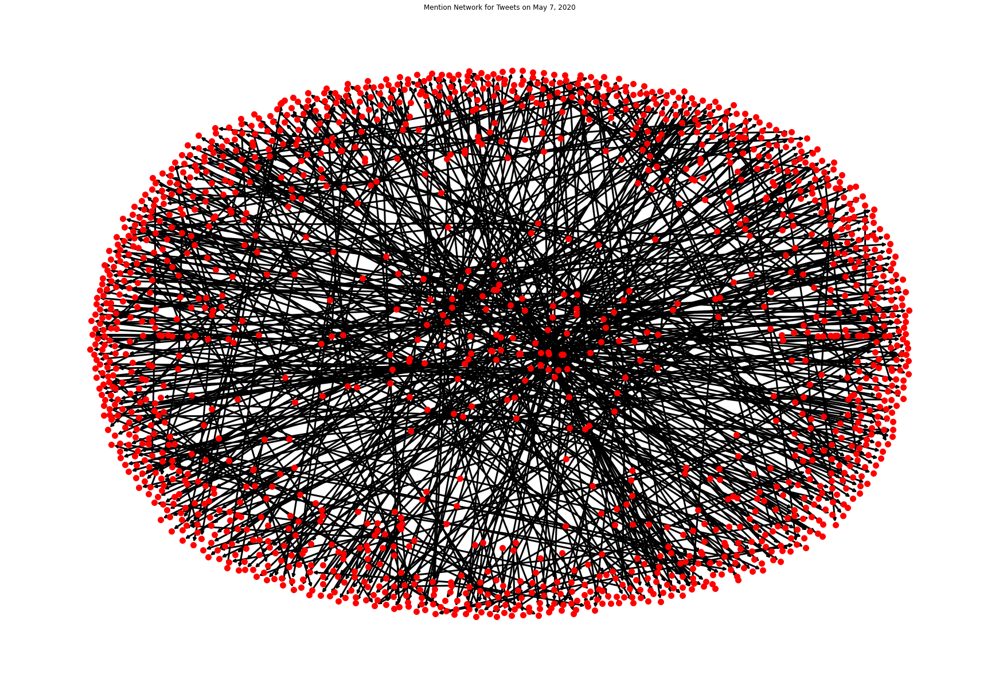

In [16]:
mention_edges = []
def get_mentions(entities):
    users_mentioned = []
    if type(entities) == type({}) and "mentions" in entities:
        for user in entities["mentions"]:
            users_mentioned.append(user['username'])
    return users_mentioned
geotweet_df["users_mentioned"] = geotweet_df["entities"].apply(get_mentions)
geotweetmini_df = geotweet_df[geotweet_df.index % 10 == 0]

with open("author_ids.txt", "w") as f:
    for index, row in geotweetmini_df.iterrows():
        author_id = row["author_id"]
        f.write("\'id\': \'" + str(author_id) + '\'\n')
        
id_to_user = {}
with open("users.txt", encoding='utf-8') as f:
    for line in f:
        usr = ast.literal_eval(line)
        id_to_user[usr["id"]] = usr["username"]
        
for index, row in geotweetmini_df.iterrows():    
    author_id = row["author_id"]
    author = id_to_user[author_id]
    for user in row["users_mentioned"]:
        mention_edges.append((author, user))
    
options = {
    'node_color': 'red',
    'node_size': 100,
    'width': 3,
}
G = nx.DiGraph(mention_edges) 
plt.figure(figsize=(24,16))
nx.draw(G, **options)
plt.title('Mention Network for Tweets on May 7, 2020')
plt.savefig("mentionnetwork.png")
plt.show()

In [26]:
from plotly.subplots import make_subplots
import plotly.graph_objects as go

trimmed_followers = followers.copy()
lower_bound, upper_bound = 0, 1000
trimmed_followers = np.delete(followers, np.where(followers > upper_bound))

fig1 = px.histogram(followers, color_discrete_sequence=['blue'], title="Follower Histogram(including outliers)")
fig2 = px.histogram(trimmed_followers, color_discrete_sequence=['red'], title="Follower Histogram(excluding outliers)")

fig1.show()
fig2.show()

In [27]:
trimmed_following = following.copy()
lower_bound, upper_bound = 0, 10000
trimmed_following = np.delete(following, np.where(following > upper_bound))

fig1 = px.histogram(following, color_discrete_sequence=['blue'])
fig2 = px.histogram(trimmed_following, color_discrete_sequence=['red'])

fig1.show()
fig2.show()

In [28]:
total_deg = followers + following
trimmed_deg = total_deg.copy()
lower_bound, upper_bound = 0, 10000
trimmed_deg = np.delete(total_deg, np.where(total_deg > upper_bound))

fig1 = px.histogram(total_deg, color_discrete_sequence=['blue'])
fig2 = px.histogram(trimmed_deg, color_discrete_sequence=['red'])

fig1.show()
fig2.show()

In [56]:
import folium
from folium import plugins
from folium.plugins import HeatMap

id_to_centercord = {}
with open("places.txt", encoding='utf-8') as f:
    for line in f:
        line = ast.literal_eval(line)
        bottomleft_long = line["geo"]["bbox"][0]
        bottomleft_lat = line["geo"]["bbox"][1]
        topright_long = line["geo"]["bbox"][2]
        topright_lat = line["geo"]["bbox"][3]
        id_to_centercord[line["id"]] = ((bottomleft_lat + topright_lat)/2, (bottomleft_long + topright_long)/2)

map_hooray = folium.Map([48, 5], tiles='stamentoner', zoom_start=6)

def extract_place(geo):
    if type(geo) == type({}) and "place_id" in geo:
        return geo["place_id"]
def extract_latitude(place_id):
    if place_id in id_to_centercord:
        return id_to_centercord[place_id][0]
    return "NaN"
def extract_longitude(place_id):
    if place_id in id_to_centercord:
        return id_to_centercord[place_id][1]
    return "NaN"

geotweet_df['place_id'] = geotweet_df['geo'].apply(extract_place)
geotweet_df['latitude'] = geotweet_df['place_id'].apply(extract_latitude)
geotweet_df['longitude'] = geotweet_df['place_id'].apply(extract_longitude)

# Remove NaN
heat_df = geotweet_df[['latitude', 'longitude', 'hour_tweeted']].copy()
heat_df['latitude'] = heat_df['latitude'].astype(float)
heat_df['longitude'] = heat_df['longitude'].astype(float)
heat_df = heat_df.dropna(subset=['longitude'])
heat_df = heat_df.dropna(subset=['latitude'])

# List comprehension to make out list of lists
heat_data = [[[row['latitude'],row['longitude']] for index, row in heat_df[heat_df['hour_tweeted'] == i].iterrows()] for i in range(24)]

hm = plugins.HeatMapWithTime(heat_data,auto_play=True,max_opacity=0.8)
hm.add_to(map_hooray)

# Plot it on the map
# HeatMap(heat_data).add_to(map_hooray)

# Display the map
map_hooray

In [43]:
def get_geojson_grid(upper_right, lower_left, m, n):
    all_boxes = []
    
    lat_steps = np.linspace(lower_left[0], upper_right[0], m+1)
    lon_steps = np.linspace(lower_left[1], upper_right[1], n+1)
    
    lat_stride = lat_steps[1] - lat_steps[0]
    lon_stride = lon_steps[1] - lon_steps[0]
    
    for lat in lat_steps[:-1]:
        for lon in lon_steps[:-1]:
            # Define dimensions of box in grid
            upper_left = [lon, lat + lat_stride]
            upper_right = [lon + lon_stride, lat + lat_stride]
            lower_right = [lon + lon_stride, lat]
            lower_left = [lon, lat]

            # Define json coordinates for polygon
            coordinates = [
                upper_left,
                upper_right,
                lower_right,
                lower_left,
                upper_left
            ]

            geo_json = {"type": "FeatureCollection",
                        "properties":{
                            "lower_left": lower_left,
                            "upper_right": upper_right
                        },
                        "features":[]}

            grid_feature = {
                "type":"Feature",
                "geometry":{
                    "type":"Polygon",
                    "coordinates": [coordinates],
                }
            }

            geo_json["features"].append(grid_feature)

            all_boxes.append(geo_json)

    return all_boxes

In [100]:
import matplotlib as mpl
import json
from folium.plugins import MarkerCluster
import branca.colormap as cmp

# box around central USA
lower_left = [25, -125] 
upper_right = [50, -50]

# divide into mxn grid
tweet_choroplethmap = folium.Map(zoom_start = 3, location=[37.5, -100])
grid = get_geojson_grid(upper_right, lower_left, 5, 5)

popups = []
regional_counts = []

# Compute tweet count in each grid
for box in grid:
    upper_right = box["properties"]["upper_right"]
    lower_left = box["properties"]["lower_left"]

    mask = (
        (heat_df.latitude < upper_right[1]) & (heat_df.latitude >= lower_left[1]) &
        (heat_df.longitude < upper_right[0]) & (heat_df.longitude >= lower_left[0])
           )
    
    region_tweetcount = len(heat_df[mask])
    regional_counts.append(region_tweetcount)
    
    content = "total tweets: {:,.0f}".format(region_tweetcount)
    popup = folium.Popup(content)
    popups.append(popup)
    
max_count = max(regional_counts)
min_count = min(regional_counts)
cmap = cmp.LinearColormap(colors=['white','red'], 
                          index=[min_count, max_count],
                          vmin=min_count,
                          vmax=max_count,
                          caption='Box color by tweet count')

# Color grids according to tweet counts
for i, box in enumerate(grid):
    geo_json = json.dumps(box)

    #color = plt.cm.Reds(regional_counts[i] / worst_region)
    color = cmap(regional_counts[i])
    color = mpl.colors.to_hex(color)

    gj = folium.GeoJson(geo_json,
                        style_function=lambda feature, color=color: {
                                                                        'fillColor': color,
                                                                        'color':"black",
                                                                        'weight': 2,
                                                                        'dashArray': '5, 5',
                                                                        'fillOpacity': 0.55,
                                                                    })

    gj.add_child(popups[i])
    tweet_choroplethmap.add_child(gj)

# Marker clusters
locations = list(zip(heat_df.latitude, heat_df.longitude))
icons = [folium.Icon(icon="twitter", prefix="fa") for _ in range(len(locations))]
cluster = MarkerCluster(locations=locations, icons=icons)
tweet_choroplethmap.add_child(cluster)
tweet_choroplethmap.add_child(cmap)

#Display graph
tweet_choroplethmap